# **Image Alignment Program for IRIS, ALMA, and SDO Images**

## Last modified: F.J Ordoñez A,  11.24.2023 
## email: fjordoneza@unal.edu.co

## **Instructions for Using this Program:**

1. Ensure you have snapshots taken by the AIA filters 171, 304, 1600, 1700, and HMI. These images should account for the Sun's differential rotation. You can download them using the "d06_download_sdo_data.ipynb" function available in this repository.

2. You also need IRIS images taken in the 1330, 1400, 2786, and 2832 filters. Please note that in some observations, data may not be available for all these filters. In such cases, you should comment out the command lines corresponding to the filters for which you don't have data in the "ALIGNING ALMA with IRIS" and "ALIGNING IRIS WITH SDO" sections.

We strongly recommend reading the article associated with these codes, which will be referenced in this project's readme.


In [1]:
import os 
import sys 
import glob 
import salat
import matplotlib
import numpy as np 
import pandas as pd
from tqdm import tqdm
import numpy.ma as ma
from function_used import *  #file where is some usefulls functions 
from astropy.io import fits
from datetime import datetime 
import matplotlib.pyplot as plt
import warnings
warnings.filterwarnings("ignore")

## Reading IRIS and SDO/AIA 304  FILES 

In [2]:
path_files_telescopes = '/media/javier/SSD_2/OtrasRegiones/D06/'

path_ALMA=glob.glob(path_files_telescopes+"ALMA/*.fits")
if len(path_ALMA)!=0 and len(path_ALMA)>1:
    print("ERROR: There are many .fits files in the ALMA folder.")
    sys.exit() 
if len(path_ALMA) == 0:
    print("ERROR: There are no .fits files in the ALMA folder")
    sys.exit() 
    
file= path_ALMA[0]
almacube, header, timesec, timeutc, beammajor, beamminor, beamangle = salat.read(file,timeout=True,beamout=True,
                                                                                 HEADER=True,SILENT=False,fillNan=True)

alma_rote= fun_alma_rotate(almacube,header)



path_iris=glob.glob(path_files_telescopes+'IRIS/*.fits')
iris_1330, iris_1400, iris_2796, iris_2832 =0, 0, 0, 0

if len(path_iris)!=4 and len(path_iris)<=4: 
    print("ERROR: Missing .fits files in the IRIS archive")
    print("NOTE: Missing  .fits files in the IRIS archive. This program is \n designed to do the alignment using filter of 1330Å,1400Å,2796Å and 2832Å")

control_variable=0
for i in path_iris:
    twave1 = int(fits.open(i)[0].header['TWAVE1'])

    if   twave1==1330:
        iris_1330= fits.open(i)
        control_variable+=1
    elif twave1==1400:
        iris_1400= fits.open(i)
        control_variable+=1
    elif twave1==2796:
        iris_2796= fits.open(i)
        control_variable+=1
    elif twave1==2832:
        iris_2832= fits.open(i)
        control_variable+=1
if control_variable>4:
    print("Error: There are duplicate files in the IRIS folder.")
    print("Be sure to remove the duplicate files for the IRIS filters 1330Å,1400Å,2796Å and 2832Å.")
    sys.exit() 
if control_variable!= 4 and control_variable<4:
    print("ERROR: Missing  .fits files in the IRIS archive.")
    print("ERROR: Missing  .fits files in the IRIS archive. This program is \n designed to do the alignment using filter of 1330Å,1400Å,2796Å and 2832Å")
    sys.exit() 
time_vec_iris = creating_time_vector(iris_1330)



if len (glob.glob(path_files_telescopes+'SDO/*'))!=5:
    print(print("ERROR: Missing  .fits files in the SDO archive."))
    print("ERROR: Missing  .fits files in the ALMA archive. This program is \n designed to do the alignment using filter of  AIA ,304,1600,1700 Å,  and HMI")
    sys.exit()
    
path_sdo=path_files_telescopes+'SDO/{}/crop_and_rotate/*.fits'
data_171 ,  time_171  = create_data_cube(path_sdo.format(171)   ,'aia')
data_304 ,  time_304  = create_data_cube(path_sdo.format(304)   ,'aia')
data_1600,  time_1600 = create_data_cube(path_sdo.format(1600)  ,'aia')
data_1700,  time_1700 = create_data_cube(path_sdo.format(1700)  ,'aia')
data_hmi ,  time_hmi  = create_data_cube(path_sdo.format('magt'),'hmi')
    
df_resolution = { 'AIA94'  : 0.600109,'AIA131' : 0.600698, 
                  'AIA171' : 0.599489,'AIA193' : 0.600714,
                  'AIA211' : 0.600758,'AIA304' : 0.600165,
                  'AIA335' : 0.600737,'AIA1600': 0.609373,
                  'AIA1700': 0.612898, 'HMI'   : 0.504349 }

parameters      = pd.read_excel('parameters.xlsx')
alma_pix_size   = parameters.iloc[4][1]
scale_iris_alma = iris_1330[0].header['CDELT1']/alma_pix_size
scale_iris_alma


---------------------------------------------------
--------------- SALAT READ part of ----------------
-- Solar Alma Library of Auxiliary Tools (SALAT) --

Reading ALMA cube



100%|██████████| 1608/1608 [00:00<00:00, 25412.94it/s]


---------------------------------------------------
--------------- SALAT INFO part of ----------------
-- Solar Alma Library of Auxiliary Tools (SALAT) --


----------------------------------------------
| Data feat.: 
----------------------------------------------
|  ALMA BAND:  3
|  Obs. Date:  2018-04-12
|  ALMA proj:  2017.1.00653.S
|  Pix. Unit:  K
|  Pix. Size:  0.3  arcsec.
|  Beam mean:  2.15798  arcsec
|  FOV. diam:  notcomputed
----------------------------------------------
| Data range 
----------------------------------------------
|  Min =  5260.81054688  Kelvin
|  Max =  10677.8203125  Kelvin
----------------------------------------------

Done!
Rotating ALMA cube


100%|██████████| 1608/1608 [00:13<00:00, 120.82it/s]


rotate angle -26.1446
|------Doing AIA cubic------|
167


dirs: 100%|██████████| 167/167 [00:00<00:00, 198.70it/s]


All frame has the same shape
|------Doing AIA cubic------|
167


dirs: 100%|██████████| 167/167 [00:00<00:00, 251.77it/s]


All frame has the same shape
|------Doing AIA cubic------|
85


dirs: 100%|██████████| 85/85 [00:00<00:00, 250.12it/s]


All frame has the same shape
|------Doing AIA cubic------|
84


dirs: 100%|██████████| 84/84 [00:00<00:00, 251.38it/s]


All frame has the same shape
|------Doing HMI cubic------|
46


100%|██████████| 46/46 [00:00<00:00, 325.59it/s]


All frame has the same shape


0.5545

# ALIGNING  ALMA with IRIS

In [4]:
print('ALIGNING IRIS WITH ALMA')
x_max_pearson_1330, y_max_pearson_1330, IRIS_1330_n_0, IRIS_1330_n_f = similarity(iris_1330, timeutc, alma_rote, alma_pix_size,  method='pearson')
x_max_pearson_1400, y_max_pearson_1400, IRIS_1400_n_0, IRIS_1400_n_f = similarity(iris_1400, timeutc, alma_rote, alma_pix_size,  method='pearson')
x_max_pearson_2796, y_max_pearson_2796, IRIS_2796_n_0, IRIS_2796_n_f = similarity(iris_2796, timeutc, alma_rote, alma_pix_size,  method='pearson')
x_max_pearson_2832, y_max_pearson_2832, IRIS_2832_n_0, IRIS_2832_n_f = similarity(iris_2832, timeutc, alma_rote, alma_pix_size,  method='pearson')
x_mean_iris_alma, y_mean_iris_alma = (x_max_pearson_1330 + x_max_pearson_1400 + x_max_pearson_2796 + x_max_pearson_2832)/4 , (y_max_pearson_1330 + y_max_pearson_1400 + y_max_pearson_2796 + y_max_pearson_2832)/4
x_mean_iris_alma, y_mean_iris_alma

ALIGNING IRIS WITH ALMA
|-----------Aligning ALMA  with IRIS 1330.0  images----------| 
scale_factor: 0.5545
ReScaling IRIS Image


100%|██████████| 950/950 [00:02<00:00, 335.67it/s]


Old IRIS VECTOR (950, 774, 735) New IRIS VECTOR (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
________________________________________________________________________
t_0 position in the IRIS array: 266 | t_f position in the IRIS array: 319
|----Estimating Pearson coeffients ans Estimating Structural Similarity Index  (SSIM) ---- | 


________________________________________________________________________
x_max_pearson= 206 | y_max_pearson= 200 | r= 0.7212863273322236
________________________________________________________________________
x_max_ssim   = 206 | y_max_ssim   = 201 | r= 0.2559658957333152
|-----------Aligning ALMA  with IRIS 1400.0  images----------| 
scale_factor: 0.5545
ReScaling IRIS Image


100%|██████████| 950/950 [00:02<00:00, 411.56it/s]


Old IRIS VECTOR (950, 774, 735) New IRIS VECTOR (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
________________________________________________________________________
t_0 position in the IRIS array: 266 | t_f position in the IRIS array: 319
|----Estimating Pearson coeffients ans Estimating Structural Similarity Index  (SSIM) ---- | 


________________________________________________________________________
x_max_pearson= 207 | y_max_pearson= 201 | r= 0.5553238442864546
________________________________________________________________________
x_max_ssim   = 207 | y_max_ssim   = 201 | r= 0.14394634947041193
|-----------Aligning ALMA  with IRIS 2796.0  images----------| 
scale_factor: 0.5545
ReScaling IRIS Image


100%|██████████| 950/950 [00:02<00:00, 392.56it/s]


Old IRIS VECTOR (950, 774, 735) New IRIS VECTOR (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
________________________________________________________________________
t_0 position in the IRIS array: 266 | t_f position in the IRIS array: 319
|----Estimating Pearson coeffients ans Estimating Structural Similarity Index  (SSIM) ---- | 


________________________________________________________________________
x_max_pearson= 208 | y_max_pearson= 204 | r= 0.5189137069365268
________________________________________________________________________
x_max_ssim   = 208 | y_max_ssim   = 205 | r= 0.1453522901518624
|-----------Aligning ALMA  with IRIS 2832.0  images----------| 
scale_factor: 0.5545
ReScaling IRIS Image


100%|██████████| 950/950 [00:02<00:00, 340.43it/s]


Old IRIS VECTOR (950, 774, 735) New IRIS VECTOR (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
________________________________________________________________________
t_0 position in the IRIS array: 266 | t_f position in the IRIS array: 319
|----Estimating Pearson coeffients ans Estimating Structural Similarity Index  (SSIM) ---- | 


                                                                                                    2.37s/it]

________________________________________________________________________
x_max_pearson= 209 | y_max_pearson= 201 | r= 0.08191651241290618
________________________________________________________________________
x_max_ssim   = 262 | y_max_ssim   = 249 | r= 0.02721794569278765


(696.5734896302977, 675.8340847610459)

In [3]:
#x_mean_iris_alma, y_mean_iris_alma = 374.2110009017133, 363.390441839495

# ALIGNING IRIS WITH SDO

In [4]:
def cutting_iris_data(data_fits, x_center,y_center ):
    """
    This function cuts the IRIS data cube around the specified center coordinates.

    Parameters:
        - data_fits: IRIS data cube in FITS format.
        - x_center: x-coordinate of the center.
        - y_center: y-coordinate of the center.

    Returns:
        The cutout of the IRIS data cube centered around the specified coordinates,
        normalized by its standard deviation.
    """
    r_in_alma_resulution=(parameters.iloc[2][1]/2)*parameters.iloc[4][1]+10
    radio_new_pix= r_in_alma_resulution/data_fits[0].header['CDELT1']
    x_0=int(x_mean_iris_alma-radio_new_pix)
    x_f=int(x_mean_iris_alma+radio_new_pix)
    y_0=int(y_mean_iris_alma-radio_new_pix)
    y_f=int(y_mean_iris_alma+radio_new_pix)
    cut_aligning=[]
    for i in range(0,len(data_fits[0].data),1):
        cut_aligning.append(data_fits[0].data[i][y_0:y_f,x_0:x_f])
    cut_aligning=np.array(cut_aligning)
    return cut_aligning/np.std(cut_aligning)

In [5]:
iris_norm_cut_1330 = cutting_iris_data(iris_1330,  x_mean_iris_alma, y_mean_iris_alma )
iris_norm_cut_1400 = cutting_iris_data(iris_1400,  x_mean_iris_alma, y_mean_iris_alma )
iris_norm_cut_2796 = cutting_iris_data(iris_2796,  x_mean_iris_alma, y_mean_iris_alma )
iris_norm_cut_2832 = cutting_iris_data(iris_2832,  x_mean_iris_alma, y_mean_iris_alma )
mean_matrix        = (iris_norm_cut_1330+ iris_norm_cut_1400+ iris_norm_cut_2796+ iris_norm_cut_2832)/4

x_max_similarity_cord_304  ,y_max_similarity_cord_304    =  aligning_IRIS_with_SDO_two(np.abs(data_304) , mean_matrix, iris_2796[0].header['CDELT2'] ,time_vec_iris, time_304 , timeutc, path_sdo.format(304   ))
x_max_similarity_cord_hmi  ,y_max_similarity_cord_hmi    =  aligning_IRIS_with_SDO_two(np.abs(data_hmi) , mean_matrix, iris_2796[0].header['CDELT2'] ,time_vec_iris, time_hmi , timeutc, path_sdo.format('magt'))
x_max_similarity_cord_1600 ,y_max_similarity_cord_1600   =  aligning_IRIS_with_SDO_two(np.abs(data_1600), mean_matrix, iris_2796[0].header['CDELT2'] ,time_vec_iris, time_1600, timeutc, path_sdo.format(1600)  )
x_max_similarity_cord_1700 ,y_max_similarity_cord_1700   =  aligning_IRIS_with_SDO_two(np.abs(data_1700), mean_matrix, iris_2796[0].header['CDELT2'] ,time_vec_iris, time_1700, timeutc, path_sdo.format(1700)  )

x_cord_mean = (x_max_similarity_cord_304 +x_max_similarity_cord_hmi +x_max_similarity_cord_1600 +x_max_similarity_cord_1700)/4
y_cord_mean = (y_max_similarity_cord_304 +y_max_similarity_cord_hmi +y_max_similarity_cord_1600 +y_max_similarity_cord_1700)/4

# MEAN OF THE HELIO PROJECTIVE COORDINATES
x_cord_mean, y_cord_mean

scale_factor: 0.27717377305480334
Rescaling IRIS  images


100%|██████████| 950/950 [00:00<00:00, 1078.76it/s]


________________________________________________________________________
initial shape: (167, 230, 230) | rescaled shape: (950, 160, 160)
______________________________________________________
t_0_SDO = 2018-04-12 15:52:29.139000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_SDO = 2018-04-12 16:24:41.122000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 2 | posicion_n_f: 163
______________________________________________________
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
|----Estimating Pearson and SSIM coeffients---- | 

________________________________________________________________________
x_max_pearson= 100 | y_max_pearson= 117 | r= 0.4591008663012286
________________________________________________________________________
x_max_ssim   = 99 | y_max_ssim   = 117 | r= 0.08855932572877212
Pearson: (Tx, Ty) in arcsec -136.61664695711806 -398.0177888988077
________________________________________________________________________
SSIM   : (Tx, Ty) in arcsec -137.21681170142256 -398.01778813005507
mean (T_x, T_y)= -136.9167293292703 -398.01778851443134
scale_factor: 0.32983121124208165
Rescaling IRIS  images


100%|██████████| 950/950 [00:01<00:00, 617.10it/s]


________________________________________________________________________
initial shape: (46, 273, 273) | rescaled shape: (950, 190, 190)
______________________________________________________
t_0_SDO = 2018-04-12 15:52:16.700000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_SDO = 2018-04-12 16:24:31.700000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 1 | posicion_n_f: 44
______________________________________________________
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
|----Estimating Pearson and SSIM coeffients---- | 


________________________________________________________________________
x_max_pearson= 124 | y_max_pearson= 145 | r= 0.34822568915645485
________________________________________________________________________
x_max_ssim   = 125 | y_max_ssim   = 145 | r= 0.10893007793273386
Pearson: (Tx, Ty) in arcsec -134.20543486438692 -395.6884985831111
________________________________________________________________________
SSIM   : (Tx, Ty) in arcsec -133.70108620310202 -395.68849921141737
mean (T_x, T_y)= -133.95326053374447 -395.68849889726425
scale_factor: 0.27298552343246113
Rescaling IRIS  images


100%|██████████| 950/950 [00:00<00:00, 1363.32it/s]


________________________________________________________________________
initial shape: (85, 227, 227) | rescaled shape: (950, 157, 158)
______________________________________________________
t_0_SDO = 2018-04-12 15:52:38.125000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_SDO = 2018-04-12 16:24:38.117000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 2 | posicion_n_f: 82
______________________________________________________
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
|----Estimating Pearson and SSIM coeffients---- | 


________________________________________________________________________
x_max_pearson= 104 | y_max_pearson= 119 | r= 0.5417690930769694
________________________________________________________________________
x_max_ssim   = 104 | y_max_ssim   = 119 | r= 0.23532342304163303
Pearson: (Tx, Ty) in arcsec -133.16251326352358 -396.25163063174364
________________________________________________________________________
SSIM   : (Tx, Ty) in arcsec -133.16251326352358 -396.25163063174364
mean (T_x, T_y)= -133.16251326352358 -396.25163063174364
scale_factor: 0.2714154756114783
Rescaling IRIS  images


100%|██████████| 950/950 [00:00<00:00, 1268.90it/s]


________________________________________________________________________
initial shape: (84, 225, 225) | rescaled shape: (950, 156, 157)
______________________________________________________
t_0_SDO = 2018-04-12 15:52:28.720000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_SDO = 2018-04-12 16:24:28.721000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 1 | posicion_n_f: 80
______________________________________________________
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________
|----Estimating Pearson and SSIM coeffients---- | 


                                                                                                    1.61it/s]

________________________________________________________________________
x_max_pearson= 103 | y_max_pearson= 117 | r= 0.5210525900022117
________________________________________________________________________
x_max_ssim   = 103 | y_max_ssim   = 117 | r= 0.2284420085290247
Pearson: (Tx, Ty) in arcsec -133.11935196374543 -396.4737140040971
________________________________________________________________________
SSIM   : (Tx, Ty) in arcsec -133.11935196374543 -396.4737140040971
mean (T_x, T_y)= -133.11935196374543 -396.4737140040971


(-134.28796377257095, -396.6079080118841)

In [5]:
x_cord_mean, y_cord_mean = -134.28796377257095, -396.6079080118841

In [6]:
data = {'Result': ['position_x_IRIS_matrix',  'position_y_IRIS_matrix', 
                   'T_x_cordinate_IRIS_aligned_with_sdo ','T_y_cordinate_IRIS_aligned_with_sdo '],
        'Value' : [x_mean_iris_alma, y_mean_iris_alma, 
                   x_cord_mean, y_cord_mean]}
result = pd.DataFrame(data)
result.to_excel("results_alignment.xlsx")
print('Result of alignment datas',result)

Result of alignment datas                                  Result       Value
0                position_x_IRIS_matrix  374.211001
1                position_y_IRIS_matrix  363.390442
2  T_x_cordinate_IRIS_aligned_with_sdo  -134.287964
3  T_y_cordinate_IRIS_aligned_with_sdo  -396.607908


# Plotting the  alignment result

In [7]:
#  -------------------SDO CUBOS DE DATOS ROTADOS--------------------------------------

df_resolution={'AIA94'  : 0.600109,'AIA131' : 0.600698, 
               'AIA171' : 0.599489,'AIA193' : 0.600714,
               'AIA211' : 0.600758,'AIA304' : 0.600165,
               'AIA335' : 0.600737,'AIA1600': 0.609373,
               'AIA1700': 0.612898, 'HMI'   : 0.504349}

rescaling_cubo_171   = sdo_rescale(data_171 ,df_resolution['AIA171'] ,alma_pix_size)
rescaling_cubo_304   = sdo_rescale(data_304 ,df_resolution['AIA304'] ,alma_pix_size)
rescaling_cubo_hmi   = sdo_rescale(data_hmi ,df_resolution['HMI']    ,alma_pix_size)

rescaling_iris_2796  = iris_rescale(iris_2796, alma_pix_size)
rescaling_iris_2832  = iris_rescale(iris_2832, alma_pix_size)
rescaling_iris_1400  = iris_rescale(iris_1400, alma_pix_size)
rescaling_iris_1330  = iris_rescale(iris_1330, alma_pix_size)
aperture             = aperture_circ_ALMA(almacube)



#-------------------------------------AIA---------------------------------------------
n_0_171, n_f_171=find_nearest(time_171, timeutc[0], timeutc[-1], 'AIA 171', 'ALMA')
n_0_304, n_f_304=find_nearest(time_304, timeutc[0], timeutc[-1], 'AIA 304', 'ALMA')                       
files=sorted(glob.glob(path_sdo.format(171)))
aia_rot     = sunpy.map.Map(files)[n_0_171]
scale_sdo=  df_resolution['AIA304']/alma_pix_size


n_0_hmi, n_f_hmi=find_nearest(time_hmi, timeutc[0], timeutc[-1], 'HMI', 'ALMA')
hmi_rot   = sunpy.map.Map(path_sdo.format('magt'))[n_0_hmi]

c_sdo       = SkyCoord(Tx=x_cord_mean* u.arcsec, Ty=y_cord_mean* u.arcsec, frame=aia_rot.coordinate_frame)
aia_rot.world_to_pixel(c_sdo).x.value*scale_sdo ,aia_rot.world_to_pixel(c_sdo).y.value*scale_sdo
#---------------------------------------IRIS------------------------------------------

n_0_IRIS_ALMA, n_f_IRIS_ALMA = find_nearest(time_vec_iris, timeutc[0], timeutc[-1], 'AIA 304', 'ALMA')

x_cen, y_cen  = iris_2796[0].data.shape[2]/2, iris_2796[0].data.shape[1]/2
x_ref, y_ref  =  x_mean_iris_alma, y_mean_iris_alma 

x_bottom_left = x_ref-(x_cen)*iris_2796[0].header['CDELT1']
x_top_right   = x_ref+(x_cen)*iris_2796[0].header['CDELT1']
y_bottom_left = y_ref-(y_cen)*iris_2796[0].header['CDELT1']
y_top_right   = y_ref+(y_cen)*iris_2796[0].header['CDELT1']
extent_iris   = [x_bottom_left,x_top_right, y_bottom_left, y_top_right]

n_0_hmi, n_f_hmi=find_nearest(time_hmi, timeutc[0], timeutc[-1], 'HMI', 'ALMA')
hmi_rot   = sunpy.map.Map(path_sdo.format('magt'))[n_0_hmi]

c_sdo       = SkyCoord(Tx=x_cord_mean* u.arcsec, Ty=y_cord_mean* u.arcsec, frame=aia_rot.coordinate_frame)
aia_rot.world_to_pixel(c_sdo).x.value*scale_sdo ,aia_rot.world_to_pixel(c_sdo).y.value*scale_sdo
#---------------------------------------IRIS------------------------------------------

n_0_IRIS_ALMA, n_f_IRIS_ALMA = find_nearest(time_vec_iris, timeutc[0], timeutc[-1], 'AIA 304', 'ALMA')



scale_factor: 1.9982966666666668


100%|██████████| 167/167 [00:00<00:00, 303.48it/s]


________________________________________________________________________
initial shape: (167, 230, 230) | rescaled shape: (167, 460, 460)
scale_factor: 2.00055


100%|██████████| 167/167 [00:00<00:00, 282.12it/s]


________________________________________________________________________
initial shape: (167, 230, 230) | rescaled shape: (167, 460, 460)
scale_factor: 1.6811633333333336


100%|██████████| 46/46 [00:00<00:00, 223.40it/s]


________________________________________________________________________
initial shape: (46, 273, 273) | rescaled shape: (46, 459, 459)
______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:03<00:00, 245.32it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:03<00:00, 310.84it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:02<00:00, 321.80it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:02<00:00, 343.01it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
t_0_AIA 171 = 2018-04-12 15:52:33.347000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_AIA 171 = 2018-04-12 16:24:45.347000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 2 | posicion_n_f: 163
______________________________________________________
______________________________________________________
t_0_AIA 304 = 2018-04-12 15:52:29.139000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_AIA 304 = 2018-04-12 16:24:41.122000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 2 | posicion_n_f: 163
______________________________________________________
______________________________________________________
t_0_HMI = 2018-04-12 15:52:16.700000


In [8]:
x_cen, y_cen  = x_mean_iris_alma, y_mean_iris_alma 
x_ref, y_ref  = x_cord_mean, y_cord_mean

x_bottom_left = x_ref -x_cen*iris_2796[0].header['CDELT1']
x_top_right   = x_bottom_left+(iris_1330[0].data.shape[2]*iris_2796[0].header['CDELT1'])
y_bottom_left = y_ref-y_cen*iris_2796[0].header['CDELT1']
y_top_right   = y_bottom_left+(iris_1330[0].data.shape[2]*iris_2796[0].header['CDELT1'])
extent_iris   = [x_bottom_left,x_top_right, y_bottom_left, y_top_right]

vmin_2796     = np.percentile(rescaling_iris_2796,11) 
vmax_2796     = np.percentile(rescaling_iris_2796,95) 

vmin_1400     = np.percentile(rescaling_iris_1400,12) 
vmax_1400     = np.percentile(rescaling_iris_1400,95) 

vmin_1330     = np.percentile(rescaling_iris_1330,12) 
vmax_1330     = np.percentile(rescaling_iris_1330,98)

vmin_171,  vmax_171  = np.percentile(rescaling_cubo_171,11) , np.percentile(rescaling_cubo_171,95) 
vmin_304,  vmax_304  = np.percentile(rescaling_cubo_304,11) , np.percentile(rescaling_cubo_304,95) 

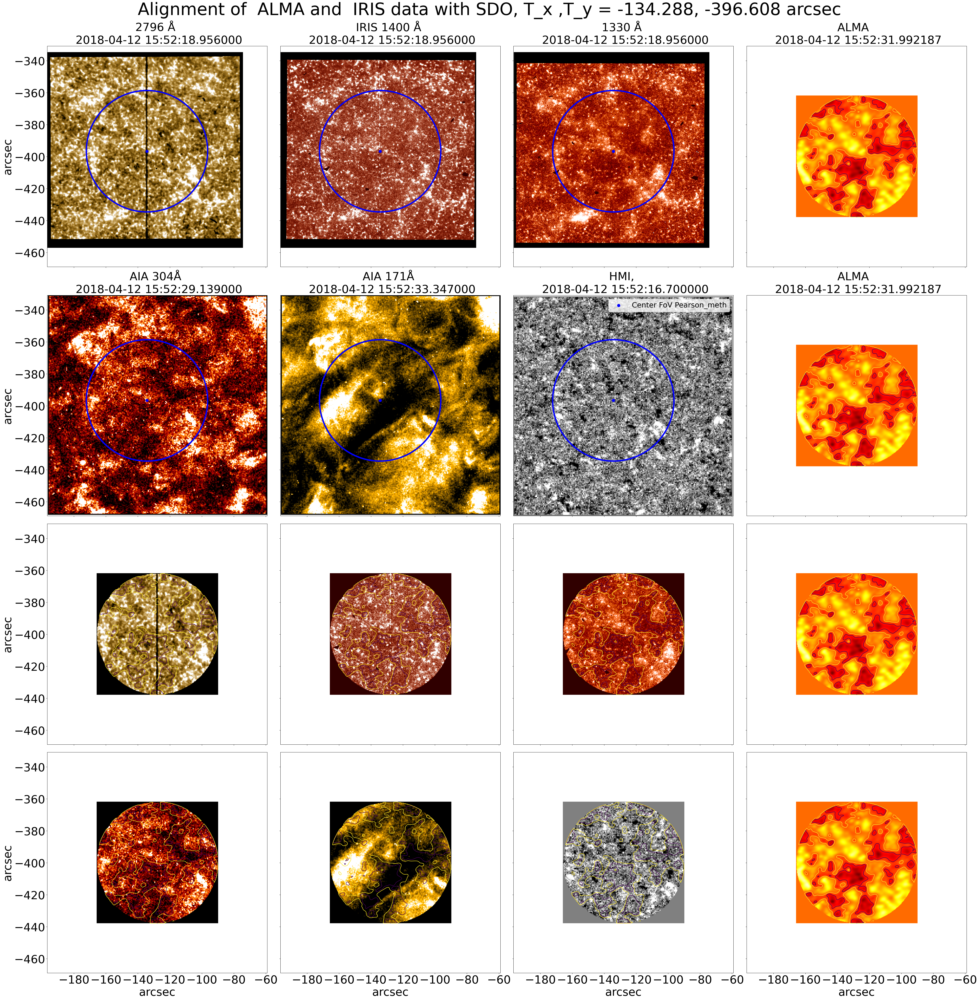

In [12]:
n_0_alma     , n_f_alma      = 0, len(almacube)

par_alma=0
par_iris= n_0_IRIS_ALMA
par_hmi = n_0_hmi
par_aia = n_0_171

fig, ax=plt.subplots(figsize=(48,48), dpi=100, ncols=4, nrows=4,  constrained_layout=True,sharex=True, sharey=True,gridspec_kw = {'wspace':0, 'hspace':0})

fontsize_word=40

cord_pix_iris_x, cord_pix_iris_y = x_cord_mean, y_cord_mean
radio=(parameters.iloc[2][1]/2)*alma_pix_size

pix_ref_x,pix_ref_y=round(parameters.iloc[3][1]/2), round(parameters.iloc[3][1]/2)
extent_alma = [parameters.iloc[0][1]-pix_ref_x*alma_pix_size, parameters.iloc[0][1]+(parameters.iloc[2][1]-pix_ref_x)*alma_pix_size, parameters.iloc[1][1]-pix_ref_y*alma_pix_size , parameters.iloc[1][1]+(parameters.iloc[2][1]-pix_ref_y)*alma_pix_size]
extent_aia  = [aia_rot.bottom_left_coord.Tx.value , aia_rot.top_right_coord.Tx.value , aia_rot.bottom_left_coord.Ty.value ,aia_rot.top_right_coord.Ty.value]
extent_hmi  = [hmi_rot.bottom_left_coord.Tx.value , hmi_rot.top_right_coord.Tx.value , hmi_rot.bottom_left_coord.Ty.value ,hmi_rot.top_right_coord.Ty.value]


#--------------------- -----------ALMA PLOTS ----------------------------------------------
ax[0,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[0,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
ax[0,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

ax[1,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[1,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
ax[1,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

ax[2,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[2,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
#ax[2,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

ax[3,3].imshow(alma_rote[par_alma], cmap='hot', origin='lower', vmax=10000,vmin=5000,extent=extent_alma)
ax[3,3].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_alma)
#ax[3,3].set_title('ALMA  \n {}'.format(timeutc[par_alma]),fontsize = fontsize_word)

#-------------------------------------------------------------------------------------------



ax[0,0].set_title('2796 Å \n {}'.format(time_vec_iris[par_iris]),fontsize = fontsize_word)
ax[0,0].imshow(iris_2796[0].data[par_iris],origin='lower',cmap='irissji2796',
               vmin=vmin_2796 , vmax=vmax_2796,extent=extent_iris)

curculo_3=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'), radio,ec='blue', fc='none',lw=5)
ax[0,0].add_patch(curculo_3)
ax[0,0].scatter(cord_pix_iris_x, cord_pix_iris_y,s=100, c='blue', marker='o', label='Center FoV Pearson_meth')

ax[0,1].set_title('IRIS 1400 Å \n {}'.format(time_vec_iris[par_iris]),fontsize = fontsize_word)
ax[0,1].imshow(iris_1400[0].data[par_iris],origin='lower',cmap='irissji1400',
               vmin=vmin_1400 , vmax=vmax_1400,extent=extent_iris)
curculo_3=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'), radio,ec='blue', fc='none',lw=5)
ax[0,1].add_patch(curculo_3)
ax[0,1].scatter(cord_pix_iris_x, cord_pix_iris_y,s=100, c='blue', marker='o', label='Center FoV Pearson_meth')



ax[0,2].set_title('1330 Å \n {}'.format(time_vec_iris[par_iris]),fontsize = fontsize_word)
ax[0,2].imshow(iris_1330[0].data[par_iris],origin='lower',cmap='irissji1330',
               vmin=vmin_1330 , vmax=vmax_1330,extent=extent_iris)
curculo_3=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[0,2].add_patch(curculo_3)
ax[0,2].scatter(cord_pix_iris_x, cord_pix_iris_y,s=100, c='blue', marker='o', label='Center FoV Pearson_meth')



#---------------------------------- SDO ---------------------------------------------------

ax[1,0].set_title('AIA 304Å \n {}'.format(time_304[par_aia]),fontsize = fontsize_word)
ax[1,0].imshow(rescaling_cubo_304[par_aia],extent=extent_aia
          ,cmap='sdoaia304', origin='lower',vmin=vmin_304, vmax=vmax_304)


curculo_1=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[1,0].add_patch(curculo_1)
ax[1,0].scatter(cord_pix_iris_x, cord_pix_iris_y,s=100, c='blue', marker='o', label='Center FoV Pearson_meth')


ax[1,1].set_title('AIA 171Å \n {}'.format(time_171[par_aia]),fontsize = fontsize_word)
ax[1,1].imshow(rescaling_cubo_171[par_aia],extent=extent_aia
          ,cmap='sdoaia171', origin='lower',vmin=vmin_171, vmax=vmax_171)

curculo_1=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[1,1].add_patch(curculo_1)
ax[1,1].scatter(cord_pix_iris_x, cord_pix_iris_y,s=100, c='blue', marker='o', label='Center FoV Pearson_meth')



ax[1,2].set_title('HMI, \n {}'.format(time_hmi[par_hmi]),fontsize = fontsize_word)
ax[1,2].imshow(rescaling_cubo_hmi[par_hmi],cmap='gray', origin='lower',vmin=-20,vmax=20,extent=extent_hmi)
curculo_1=matplotlib.patches.Circle(( cord_pix_iris_x,cord_pix_iris_y,'b*'),radio,ec='blue', fc='none',lw=5)
ax[1,2].add_patch(curculo_1)
ax[1,2].scatter(cord_pix_iris_x, cord_pix_iris_y,s=100, c='blue', marker='o', label='Center FoV Pearson_meth')

ax[1,2].legend(prop={"size":26})



x_max_iris, y_max_iris=  round(x_mean_iris_alma*scale_iris_alma) , round(y_mean_iris_alma*scale_iris_alma)
y_new_i_iris=int(y_max_iris-parameters.iloc[3][1]/2)
y_new_f_iris=int(y_max_iris+parameters.iloc[3][1]/2)
x_new_i_iris=int(x_max_iris-parameters.iloc[2][1]/2)
x_new_f_iris=int(x_max_iris+parameters.iloc[2][1]/2)

if  int(y_new_f_iris- y_new_i_iris)!=almacube.shape[1]:
    y_new_f_iris=almacube.shape[1]+y_new_i_iris

if  int(x_new_f_iris- x_new_i_iris)!=almacube.shape[2]:
    x_new_f_iris=almacube.shape[2]+x_new_i_iris   

extent_new=extent_alma

ax[2,0].imshow(rescaling_iris_2796[par_iris][y_new_i_iris:y_new_f_iris, x_new_i_iris:x_new_f_iris]*aperture,origin='lower',cmap='irissji2796',
               vmin=vmin_2796 , vmax=vmax_2796,extent=extent_new)
ax[2,0].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[2,1].imshow(rescaling_iris_1400[par_iris][y_new_i_iris:y_new_f_iris, x_new_i_iris:x_new_f_iris]*aperture,origin='lower',
               vmin=vmin_1400 , vmax=vmax_1400 ,cmap='irissji1400',extent=extent_new)
ax[2,1].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[2,2].imshow(rescaling_iris_1330[par_iris][y_new_i_iris:y_new_f_iris, x_new_i_iris:x_new_f_iris]*aperture,origin='lower',
               vmin=vmin_1330 , vmax=vmax_1330,cmap='irissji1330',extent=extent_new)
ax[2,2].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

#----------------------------------------------------------------------------------



x_max_sdo, y_max_sdo = round(aia_rot.world_to_pixel(c_sdo).x.value*scale_sdo) , round(aia_rot.world_to_pixel(c_sdo).y.value*scale_sdo)
y_new_i_sdo=int(y_max_sdo-parameters.iloc[3][1]/2)
y_new_f_sdo=int(y_max_sdo+parameters.iloc[3][1]/2)
x_new_i_sdo=int(x_max_sdo-parameters.iloc[2][1]/2)
x_new_f_sdo=int(x_max_sdo+parameters.iloc[2][1]/2)

if  int(y_new_f_sdo- y_new_i_sdo)!=almacube.shape[1]:
    y_new_f_sdo=almacube.shape[1]+y_new_i_sdo

if  int(x_new_f_sdo- x_new_i_sdo)!=almacube.shape[2]:
    x_new_f_sdo=almacube.shape[2]+x_new_i_sdo   



ax[3,0].imshow(rescaling_cubo_304[par_aia][y_new_i_sdo:y_new_f_sdo, x_new_i_sdo:x_new_f_sdo]*aperture
          ,cmap='sdoaia304', origin='lower',vmin=vmin_304, vmax=vmax_304,extent=extent_new)
ax[3,0].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[3,1].imshow(rescaling_cubo_171[par_aia][y_new_i_sdo:y_new_f_sdo, x_new_i_sdo:x_new_f_sdo]*aperture
          ,cmap='sdoaia171', origin='lower',vmin=vmin_171, vmax=vmax_171,extent=extent_new)
ax[3,1].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[3,2].imshow(rescaling_cubo_hmi[par_hmi][y_new_i_sdo:y_new_f_sdo, x_new_i_sdo:x_new_f_sdo]*aperture
          ,cmap='gray', origin='lower',vmin=-20,vmax=20,extent=extent_new)

ax[3,2].contour(alma_rote[par_alma],levels=[7000,7500],extent=extent_new)

ax[0,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[0,0].tick_params(axis="y", labelsize= fontsize_word)
ax[1,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[1,0].tick_params(axis="y", labelsize= fontsize_word)
ax[2,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[2,0].tick_params(axis="y", labelsize= fontsize_word)
ax[3,0].set_ylabel('arcsec' , fontsize = fontsize_word),ax[3,0].tick_params(axis="y", labelsize= fontsize_word)
ax[3,0].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,0].tick_params(axis="x", labelsize= fontsize_word)
ax[3,1].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,1].tick_params(axis="x", labelsize= fontsize_word)
ax[3,2].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,2].tick_params(axis="x", labelsize= fontsize_word)
ax[3,3].set_xlabel('arcsec' , fontsize = fontsize_word),ax[3,3].tick_params(axis="x", labelsize= fontsize_word)

sub_title=fig.suptitle('Alignment of  ALMA and  IRIS data with SDO, T_x ,T_y = {}, {} arcsec'.format(round(x_cord_mean, 3), round(y_cord_mean,3)),fontsize = fontsize_word+20, y=1.02)
#plt.savefig('result_alingnment_with_iris.jpg',dpi=200, bbox_extra_artists=(sub_title,), bbox_inches="tight")
plt.savefig('result_alingnment_with_iris.jpg',dpi=200)

# Making a croppig in IRIS and SDO data using the alignment result

mkdir: cannot create directory ‘result_align’: File exists


|------Doing AIA cubic------|
167


dirs:   0%|          | 0/167 [00:00<?, ?it/s]

dirs: 100%|██████████| 167/167 [00:00<00:00, 223.64it/s]


All frame has the same shape
scale_factor: 1.99829658


100%|██████████| 167/167 [00:00<00:00, 327.16it/s]


________________________________________________________________________
initial shape: (167, 230, 230) | rescaled shape: (167, 460, 460)
______________________________________________________
t_0_AIA 171 = 2018-04-12 15:52:33.347000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_AIA 171 = 2018-04-12 16:24:45.347000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 2 | posicion_n_f: 163
______________________________________________________
206.98653607597902 238.36532117757176 1.99829658


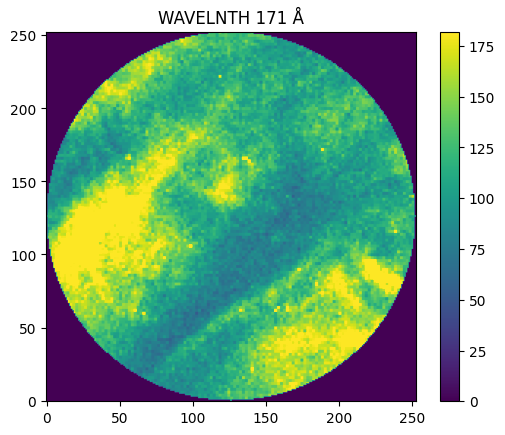

|------Doing HMI cubic------|
46


100%|██████████| 46/46 [00:00<00:00, 230.56it/s]


All frame has the same shape
scale_factor: 1.6811629133333332


100%|██████████| 46/46 [00:00<00:00, 270.73it/s]


________________________________________________________________________
initial shape: (46, 273, 273) | rescaled shape: (46, 459, 459)
______________________________________________________
t_0_AIA magt = 2018-04-12 15:52:16.700000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_AIA magt = 2018-04-12 16:24:31.700000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 1 | posicion_n_f: 44
______________________________________________________
208.18910477594196 240.70391203976058 1.6811629133333332


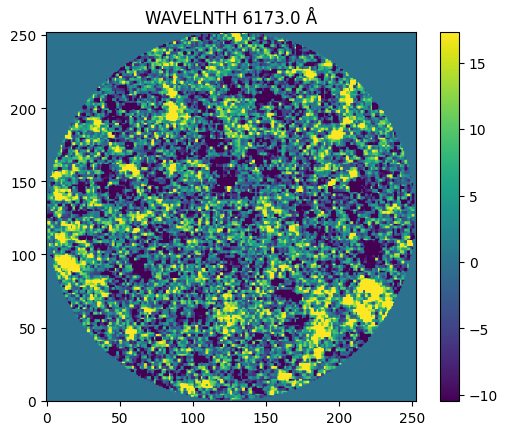

In [21]:
# ------------------- CROPPING SDO DATAS ------------------------
wl=[171,304,1600,1700]

path_sdo=path_files_telescopes+ 'SDO/{}/crop_and_rotate/*.fits'

parameters      = pd.read_excel('parameters.xlsx')
alma_pix_size   = parameters.iloc[4][1]
results         = pd.read_excel('results_alignment.xlsx')
cord_aling      = (results.iloc[2][2], results.iloc[3][2])
os.system('mkdir result_align')
for wavelength in  wl:
    data_cube, time_cube =create_data_cube(path_sdo.format(wavelength),'aia')
    files=sorted(glob.glob(path_files_telescopes+'SDO/{}/crop_and_rotate/*.fits'.format(wavelength)))
    x_data, t_data = cutting_sdo_data(data_cube,time_cube, files ,cord_aling, almacube, timeutc ,'{}'.format(wavelength) ,alma_pix_size)
    np.save('result_align/crop_and_aling_AIA_{}_with_Pixel_ALMA_size'.format(wavelength), x_data , allow_pickle=True)
    np.save('result_align/time_cut_AIA{}'.format(wavelength)      , t_data , allow_pickle=True)

files_mag              = sorted(glob.glob(path_files_telescopes+'SDO/{}/crop_and_rotate/*.fits'.format('magt')))
data_hmi, time_hmi     = create_data_cube(path_files_telescopes+'SDO/{}/crop_and_rotate/*.fits'.format('magt'),'hmi')    
x_data_hmi, t_data_hmi = cutting_sdo_data(data_hmi,time_hmi, files_mag ,cord_aling, almacube, timeutc ,'magt' ,alma_pix_size)
np.save('result_align/crop_and_aling_HMI_ALMA_size', x_data_hmi , allow_pickle=True)
np.save('result_align/time_cut_HMI'                , t_data_hmi , allow_pickle=True)

In [22]:
  
def  cutting_iris_data(files, time_vec,cord_pix_max  ,alma_cube, alma_time , pix_size_alma):
    aperture           = aperture_circ_ALMA(alma_cube)
    rescaling_iris     = iris_rescale(files, pix_size_alma)
    aperture           = aperture_circ_ALMA(alma_cube)
    scale_factor       =  files[0].header['CDELT1']/pix_size_alma
    n_0_time, n_f_time = find_nearest(time_vec, alma_time[0], alma_time[-1], 'IRIS', 'ALMA')
    time_vec_iris = creating_time_vector(files)
    x_resul_iris=cord_pix_max[0]*scale_factor
    y_resul_iris=cord_pix_max[1]*scale_factor
    radio_new_pix= alma_cube.shape[1]/2

    x_0=int(x_resul_iris-radio_new_pix)
    x_f=int(x_resul_iris+radio_new_pix)
    y_0=int(y_resul_iris-radio_new_pix)
    y_f=int(y_resul_iris+radio_new_pix)
    
    if  int(x_f- x_0)!=alma_cube.shape[2]:
        x_f=alma_cube.shape[2]+x_0
    if  int(y_f- y_0)!=alma_cube.shape[1]:
        y_f=alma_cube.shape[1]+y_0

    image_cuted=[]
    for i in range(n_0_time,n_f_time+1,1):
        image_cuted.append(rescaling_iris[i][y_0:y_f, x_0:x_f]*aperture)
    image_cuted=np.array(image_cuted)
    time_vec=time_vec[n_0_time:n_f_time+1]
    
    plt.figure()
    plt.title(str(time_vec_iris[n_0_time]))
    vmin= np.percentile(image_cuted,13) 
    vmax= np.percentile(image_cuted,98) 
    plt.imshow(image_cuted[0],  origin='lower', vmin=vmin , vmax=vmax)
    plt.colorbar()
    plt.show()
    
    np.save('result_align/crop_and_aling_iris_{}_Pixel_ALMA_size'.format(int(files[0].header['TWAVE1'])), image_cuted , allow_pickle=True)
    np.save('result_align/time_cut_iris_{}'.format(int(files[0].header['TWAVE1'])), time_vec , allow_pickle=True)
    
    

______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:03<00:00, 264.09it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________


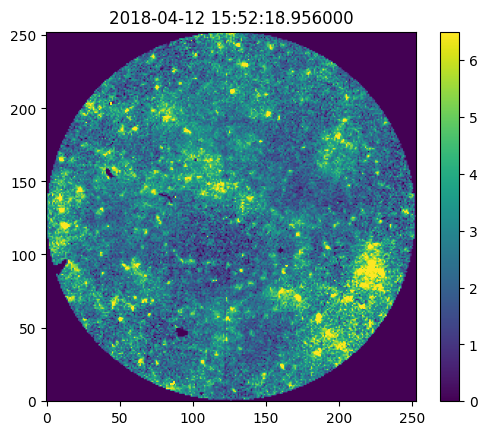

______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:03<00:00, 299.55it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________


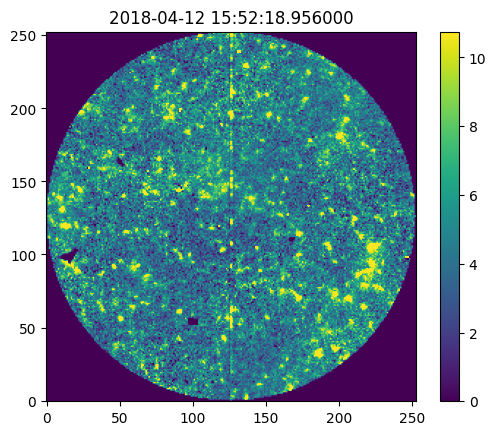

______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:03<00:00, 296.61it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________


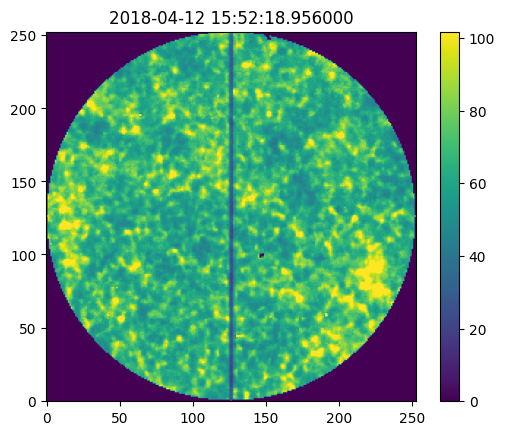

______________________________________________________
Initial shape: (950, 774, 735)
Scale_factor: 0.5545


100%|██████████| 950/950 [00:03<00:00, 288.01it/s]


______________________________________________________
final shape: (950, 429, 408)
______________________________________________________
t_0_IRIS = 2018-04-12 15:52:18.956000
t_0_ALMA= 2018-04-12 15:52:31.992187
______________________________________________________
t_f_IRIS = 2018-04-12 16:24:43.844000
t_0_ALMA= 2018-04-12 16:24:40.246093
______________________________________________________
posicion_n_0: 266 | posicion_n_f: 319
______________________________________________________


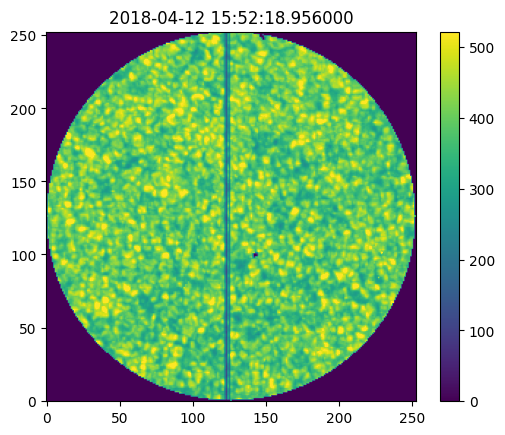

In [23]:
# ------------------- CROPPING IRIS DATAS ------------------------
cutting_iris_data(iris_1330, time_vec_iris, (int(x_mean_iris_alma), int(y_mean_iris_alma)), almacube, timeutc ,alma_pix_size)
cutting_iris_data(iris_1400, time_vec_iris, (int(x_mean_iris_alma), int(y_mean_iris_alma)), almacube, timeutc ,alma_pix_size)
cutting_iris_data(iris_2796, time_vec_iris, (int(x_mean_iris_alma), int(y_mean_iris_alma)), almacube, timeutc ,alma_pix_size)
cutting_iris_data(iris_2832, time_vec_iris, (int(x_mean_iris_alma), int(y_mean_iris_alma)), almacube, timeutc ,alma_pix_size)